# Geospatial visualization

::::: {.grid}

:::: {.g-col-6}

::: {.callout-note appearance="minimal"}
## Lecture learning goals

1. Explain what GeoJSON files are
2. Download and use GeoJSON files for different regions
3. Plot GeoJSON data
4. Appropriate project geospatial data
5. Create Choropleth and point maps
6. Describe common pitfalls of Choropleths and how to remedy them
7. Link maps to interactivity
8. Inlude maps in a dashboard
9. Drive callbacks via selections in a map

:::
    
::::

:::: {.g-col-6}

::: {.callout-note appearance="minimal"}
## Required activities

- [Chapter 15 in Fundamentals of Data Visualization](https://clauswilke.com/dataviz/geospatial-data.html)

**Optional activities**

- Revisit [lecture 7 and 8 from 574](https://pages.github.ubc.ca/MDS-2022-23/DSCI_574_spat-temp-mod_students/lectures/lecture7_intro-to-spatial.html)
- Learn [more about Altair maps](https://altair-viz.github.io/user_guide/marks/geoshape.html#mapping-points)
- Learn [more about Plotly maps in R](https://plotly-r.com/maps.html)

*You can read these either before or after class*               

:::

::::

:::::

**Lecture slides**

![](slides-lec4.pdf#zoom=75&&navpanes=0&statusbar=0&messages=0&pagemode=none){width=100% height=440px}

## GeoJSON

Up to this point,
we have worked with JSON and CSV formatted datasets that correspond to data tables made up of rows (records) and columns (fields).
In order to represent geographic regions (countries, states, _etc._) and trajectories (flight paths, subway lines, _etc._),
we need to expand our repertoire with additional formats designed to support these richer geometries.

[GeoJSON](https://en.wikipedia.org/wiki/GeoJSON) models geographic features within a specialized JSON format.
A GeoJSON `feature` can include geometric data, such as `longitude`, `latitude` coordinates that make up a country boundary, as well as additional data attributes.
Here is a GeoJSON `feature` object for the boundary of the U.S. state of Colorado:

~~~ json
{
  "type": "Feature",
  "id": 8,
  "properties": {"name": "Colorado"},
  "geometry": {
    "type": "Polygon",
    "coordinates": [
      [[-106.32056285448942,40.998675790862656],[-106.19134826714341,40.99813863734313],[-105.27607827344248,40.99813863734313],[-104.9422739227986,40.99813863734313],[-104.05212898774828,41.00136155846029],[-103.57475287338661,41.00189871197981],[-103.38093099236758,41.00189871197981],[-102.65589358559272,41.00189871197981],[-102.62000064466328,41.00189871197981],[-102.052892177978,41.00189871197981],[-102.052892177978,40.74889940428302],[-102.052892177978,40.69733266640851],[-102.052892177978,40.44003613055551],[-102.052892177978,40.3492571857556],[-102.052892177978,40.00333031918079],[-102.04930288388505,39.57414465707943],[-102.04930288388505,39.56823596836465],[-102.0457135897921,39.1331416175485],[-102.0457135897921,39.0466599009048],[-102.0457135897921,38.69751011321283],[-102.0457135897921,38.61478847120581],[-102.0457135897921,38.268861604631],[-102.0457135897921,38.262415762396685],[-102.04212429569915,37.738153927339205],[-102.04212429569915,37.64415206142214],[-102.04212429569915,37.38900413964724],[-102.04212429569915,36.99365914927603],[-103.00046581851544,37.00010499151034],[-103.08660887674611,37.00010499151034],[-104.00905745863294,36.99580776335414],[-105.15404227428235,36.995270609834606],[-105.2222388620483,36.995270609834606],[-105.7175614468747,36.99580776335414],[-106.00829426840322,36.995270609834606],[-106.47490250048605,36.99365914927603],[-107.4224761410235,37.00010499151034],[-107.48349414060355,37.00010499151034],[-108.38081766383978,36.99903068447129],[-109.04483707103458,36.99903068447129],[-109.04483707103458,37.484617466122884],[-109.04124777694163,37.88049961001363],[-109.04124777694163,38.15283644441336],[-109.05919424740635,38.49983761802722],[-109.05201565922046,39.36680339854235],[-109.05201565922046,39.49786885730673],[-109.05201565922046,39.66062637372313],[-109.05201565922046,40.22248895514744],[-109.05201565922046,40.653823231326896],[-109.05201565922046,41.000287251421234],[-107.91779872584989,41.00189871197981],[-107.3183866123281,41.00297301901887],[-106.85895696843116,41.00189871197981],[-106.32056285448942,40.998675790862656]]
    ]
  }
}
~~~

You don't need to understand this in detail,
but having seen it once can be helpful when you encounter GeoJSON files in the wild.
The `feature` includes a `properties` object,
which can include any number of data fields,
plus a `geometry` object,
which in this case contains a single polygon that consists of `[longitude, latitude]` coordinates for the state boundary.
To learn more about the nitty-gritty details of GeoJSON, see the [official GeoJSON specification](http://geojson.org/)
or read [Tom MacWright's helpful primer](https://macwright.org/2015/03/23/geojson-second-bite).

### Where can I find geojson files?
         
Many libraries, including Altair and Plotly,
provide a few built-in GeoJSON datasets for common geographic regions.
However,
if you need a GeoJSON file for a specific region or purpose,
these sample files are not of much help.
Therefore,
we will only work with GeoJSON files directly from [Natural Earth Data](https://www.naturalearthdata.com/downloads)
which contains a variety of GeoJSON at different levels of detail
to meet all your geospatial visualization needs.

These geojson files are available in different scale resolutions.
If you are plotting the countries of the world,
it is sufficient to use the 1:110m scale resolution,
and if you are plotting regions withing a country
(e.g. states or provinces),
you can use the 1:50m scale resolution.
There are also files available for other features such as rivers, lakes, and coastlines.

As you can see the download page containes a few different options.
They are all detailed on this page,
but in brief:
    
- `Cultural` contains the boundaries of countries, states, and populated places (boundaries made by humans)
- `Physical` contains the boundaries of rivers, lakes, and coastlines (boundaries made by nature)

To get the URL for the countries in the world,
you select 1:110 scale resolution, "cultural", and "Admin 0 – Countries".
Note that if you simply copy the URL from the link "Download countries",
it will look like this:

```
https://www.naturalearthdata.com/http//www.naturalearthdata.com/download/110m/cultural/ne_110m_admin_0_countries.zip
```

But you need to change it to look like this
when using it programmatically:

```
https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip
```

You can either do this manually or check the network tab in your browser's developer console (press F12)
to see the actual URL that is being requested.



## Working with GeoJSON via geopandas
         
The `geopandas` library provides a convenient way to work with GeoJSON data in Python.
It extends the capabilities of `pandas` to support spatial data types and operations.
Let's load in the dataset for the countries of the world and take a look at the first few rows.

In [1]:
import geopandas as gpd
import pandas as pd


# Show fewer rows by default since the geojson geometries are builky in the table
pd.set_option('display.min_rows', 4) 
pd.set_option('display.max_rows', 20)

url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world_countries = gpd.read_file(url)
world_countries

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,Admin-0 country,1,5,Trinidad and Tobago,TTO,0,2,Sovereign country,1,Trinidad and Tobago,...,None,None,None,None,None,None,None,None,None,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."
176,Admin-0 country,1,3,South Sudan,SDS,0,2,Sovereign country,1,South Sudan,...,None,None,None,None,None,None,None,None,None,"POLYGON ((30.83385 3.50917, 29.95350 4.17370, ..."


That's alot of columns!
The column containing the actual outlines of the countries is the `geometry` column.
Let's keep that one plus a few other interesting ones for now.

In [2]:
world_countries = world_countries[
    ["NAME", "CONTINENT",  'SUBREGION', "POP_EST", 'ECONOMY', 'INCOME_GRP', 'GDP_MD', 'geometry']
].rename(
    columns=lambda x: x.lower()  # Lowercase column names
).assign(
    gdp_per_capita=lambda x: x["gdp_md"] / x["pop_est"] * 1e6
).query(
    'continent != "Antarctica"'
)
world_countries

,name,continent,subregion,pop_est,economy,income_grp,gdp_md,geometry,gdp_per_capita
0,Fiji,Oceania,Melanesia,889953.0,6. Developing region,4. Lower middle income,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",6175.607026
1,Tanzania,Africa,Eastern Africa,58005463.0,7. Least developed region,5. Low income,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",1089.156033
...,...,...,...,...,...,...,...,...,...
175,Trinidad and Tobago,North America,Caribbean,1394973.0,6. Developing region,2. High income: nonOECD,24269,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",17397.469342
176,S. Sudan,Africa,Eastern Africa,11062113.0,7. Least developed region,5. Low income,11998,"POLYGON ((30.83385 3.50917, 29.95350 4.17370, ...",1084.602914


You have seen previously that you can plot the data in a geopandas pandas dataframe using the `plot` method.

<Axes: >

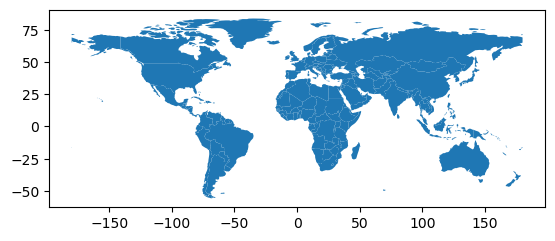

In [3]:
world_countries.plot()

And that you can use `explore` to create an interactive chart.

In [4]:
world_countries.explore()

Interestingly,
if you zoom in on this map,
you can see that the boundaries of the countries in our geojson
are not as detailed as those in the background tile/raster image provided
by the `explore` function.
The reason for this is that we chose the largest scale resolution (1:110m);
which is the most practical for plotting the entire world,
but not for zooming into small regions.

## Plotting geodata with Altair

The `plot` and `explore` methods are useful options for quickly visualizing the data,
but they are not as flexible as using Altair or Plotly,
and they don't integrate with Dash via click events
(but you could for example filter the geopandas dataframe
based on a selection in a widget and then call `explore`
if you just want to show a plot without two way interactivity).

To chart the data using Altair,
we use `mark_geoshape`.

https://www.dash-leaflet.com/components/vector_layers/geojson


In [5]:
import altair as alt

# More efficient for large data sets
alt.data_transformers.enable('vegafusion')

alt.Chart(world_countries, width=600).mark_geoshape()

alt.Chart(...)

One striking difference is how big Africa looks in the Altair plot compared to the geopandas plot!
What's going on there?
The answer is that a different default projection is used.
We will talk more about projections later,
but for now you can just remember that the default in
Altair is to adjust the country areas to be more proportional to their actual size.
For example,
Africa is ~14 times larger than Greenland in reality,
and on the Altair chart we can see this,
whereas in `explore` it looks like Greenland is larger than Africa,
which is a misrepresentation of the actual sizes.

Now that we know how to plot GeoJSON data using Altair,
we can combine it with everything we learned in 531
to create effective visualizations.

In [6]:
alt.Chart(world_countries, width=600).mark_geoshape().encode(
    color='continent',
    tooltip='name'
)

alt.Chart(...)

In [7]:
chart = alt.Chart(world_countries, width=600).mark_geoshape().encode(
    color='pop_est'
)

chart

alt.Chart(...)

In [8]:
chart.encode(color='gdp_per_capita')

alt.Chart(...)

In [9]:
chart.encode(color='economy:O')

alt.Chart(...)

In [10]:
chart.encode(color='income_grp:O')

alt.Chart(...)

What if we want to include only a specific region?
While we can adjust the coordinates of the map using the `projection` parameter,

In [11]:
alt.Chart(world_countries.query('continent == "Africa"'), width=600).mark_geoshape().encode(
    color='pop_est',
    tooltip=['name', 'pop_est']
)

alt.Chart(...)

In [12]:
alt.Chart(world_countries.query('continent == "Africa"'), width=600).mark_geoshape(stroke='grey').encode(
    color='pop_est',
    tooltip=['name', 'pop_est']
)

alt.Chart(...)

How can we see regions,
e.g. the American states or Canadian provinces?

In [13]:
alt.Chart(world_countries.query('name.isin(["Canada", "United States of America"])'), width=600).mark_geoshape()

alt.Chart(...)

As you can see,
there are no state or province boundaries in the countries GeoJSON file.
This is because we downloaded the file called "Admin 0 - Countries",
which is the highest level of boundaries,
i.e. countries.
To get more detailed boundaries,
we need to download a different file:
"Admin 1 – States, Provinces".
This file only exists at the 1:50m scale resolution at the moment.

In [14]:
url = 'https://naciscdn.org/naturalearth/50m/cultural/ne_50m_admin_1_states_provinces.zip'
world_regions = gpd.read_file(url)
world_regions

,featurecla,scalerank,adm1_code,diss_me,iso_3166_2,wikipedia,iso_a2,adm0_sr,name,name_alt,...,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,FCLASS_TLC,geometry
0,Admin-1 scale rank,2,AUS-2651,2651,AU-WA,None,AU,6,Western Australia,None,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((113.13181 -25.95199, 113.14823..."
1,Admin-1 scale rank,2,AUS-2650,2650,AU-NT,None,AU,6,Northern Territory,None,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((129.00196 -25.99901, 129.00196..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,Admin-1 scale rank,2,ZAF-1926,1926,ZA-EC,None,ZA,1,Eastern Cape,Oos-Kaap,...,None,None,None,None,None,None,None,None,None,"POLYGON ((29.01439 -29.97624, 29.11562 -30.078..."
293,Admin-1 scale rank,2,IND-2447,2447,IN-MH,None,IN,1,Maharashtra,None,...,None,None,None,None,None,None,None,None,None,"POLYGON ((74.10355 15.64457, 74.09545 15.64323..."


In [15]:
alt.Chart(world_regions, width=600).mark_geoshape().encode(
    color='admin'
)

alt.Chart(...)

In [16]:
canadian_provinces = world_regions.query("iso_a2 == 'CA'")[['wikipedia', 'name', 'region', 'postal', 'latitude', 'longitude', 'geometry']]
canadian_provinces

,wikipedia,name,region,postal,latitude,longitude,geometry
36,http://en.wikipedia.org/wiki/Alberta,Alberta,Western Canada,AB,55.2816,-115.0000,"POLYGON ((-109.99943 48.99308, -110.32130 48.9..."
37,http://en.wikipedia.org/wiki/British_Columbia,British Columbia,Western Canada,BC,54.6943,-124.6620,"MULTIPOLYGON (((-120.00001 60.00109, -120.0000..."
38,http://en.wikipedia.org/wiki/Manitoba,Manitoba,Western Canada,MB,54.8500,-97.3828,"POLYGON ((-88.94850 56.85131, -89.20522 56.694..."
39,http://en.wikipedia.org/wiki/New_Brunswick,New Brunswick,Eastern Canada,NB,46.5822,-66.4558,"MULTIPOLYGON (((-64.03094 46.01267, -64.05135 ..."
40,http://en.wikipedia.org/wiki/Newfoundland_and_...,Newfoundland and Labrador,Eastern Canada,NL,48.6598,-56.2169,"MULTIPOLYGON (((-57.10013 51.44334, -57.10097 ..."
41,http://en.wikipedia.org/wiki/Nova_Scotia,Nova Scotia,Eastern Canada,NS,45.2293,-62.8113,"MULTIPOLYGON (((-64.31465 45.83568, -64.27284 ..."
42,http://en.wikipedia.org/wiki/Northwest_Territo...,Northwest Territories,Northern Canada,NT,64.0831,-119.9420,"MULTIPOLYGON (((-110.00003 60.00109, -110.6250..."
43,http://en.wikipedia.org/wiki/Nunavut,Nunavut,Northern Canada,NU,64.3853,-97.1443,"MULTIPOLYGON (((-94.77189 60.00177, -95.25279 ..."
44,http://en.wikipedia.org/wiki/Ontario,Ontario,Eastern Canada,ON,50.5244,-84.7943,"MULTIPOLYGON (((-95.15530 49.36967, -95.16036 ..."
45,http://en.wikipedia.org/wiki/Prince_Edward_Island,Prince Edward Island,Eastern Canada,PE,46.3417,-63.3862,"POLYGON ((-63.81127 46.46869, -63.78424 46.454..."


For maps of Canada,
[the Canadian govenrment officially uses the Universal Transverse Mercator (UTM) Projection](https://natural-resources.canada.ca/earth-sciences/geography/topographic-information/maps/utm-grid-map-projections/9775)
(rotated) and sometimes also the Lambert Conformal Conic projection.

In [17]:
alt.Chart(canadian_provinces, width=600, height=500).mark_geoshape(stroke='white').project(
    'transverseMercator',
    rotate=[90, 0, 0]
).encode(
    tooltip='name',
    color=alt.Color('name').scale(scheme='tableau20'),  # To avoid repeating colors
    href='wikipedia',
)

alt.Chart(...)

### Choropleths

Choropleths are "heatmap charts",
i.e. value is mapped to the color to indicate a quantity.
Let's try it out by coloring by population!
But wait,
the population of the countries is not in the countries GeoJSON file...
Instead of loading a prepared csv file with the population data,
let's practice doing what you might have to in real life:
download the data from an internet directly.
In this case,
I notice that the data exists in an html table on the Wikipedia page for
[the Canadian provinces and territories](https://en.wikipedia.org/wiki/Provinces_and_territories_of_Canada).
The function `pd.read_html` can be used to read in html tables from a webpage
quite effectively.
It will return a list of all tables that we need to index for the table we want,
in this case the first one.

In [18]:
url = 'https://en.wikipedia.org/wiki/Population_of_Canada_by_province_and_territory'
province_populations = pd.read_html(
    url
)[0].droplevel(
    0,
    axis=1
)[['Name[1]', 'Pop.']].rename(
    columns={'Name[1]': 'name', 'Pop.': 'population'}
).assign(
    name=lambda x: x['name'].str.replace('Quebec', 'Québec')
).query(
    'name != "Canada"'
)

province_populations

,name,population
0,Ontario,14223942
1,Québec,8501833
2,British Columbia,5000879
3,Alberta,4262635
4,Manitoba,1342153
5,Saskatchewan,1132505
6,Nova Scotia,969383
7,New Brunswick,775610
8,Newfoundland and Labrador,510550
9,Prince Edward Island,154331


In [19]:
canadian_provinces = canadian_provinces.merge(province_populations)
canadian_provinces

,wikipedia,name,region,postal,latitude,longitude,geometry,population
0,http://en.wikipedia.org/wiki/Alberta,Alberta,Western Canada,AB,55.2816,-115.0000,"POLYGON ((-109.99943 48.99308, -110.32130 48.9...",4262635
1,http://en.wikipedia.org/wiki/British_Columbia,British Columbia,Western Canada,BC,54.6943,-124.6620,"MULTIPOLYGON (((-120.00001 60.00109, -120.0000...",5000879
2,http://en.wikipedia.org/wiki/Manitoba,Manitoba,Western Canada,MB,54.8500,-97.3828,"POLYGON ((-88.94850 56.85131, -89.20522 56.694...",1342153
3,http://en.wikipedia.org/wiki/New_Brunswick,New Brunswick,Eastern Canada,NB,46.5822,-66.4558,"MULTIPOLYGON (((-64.03094 46.01267, -64.05135 ...",775610
4,http://en.wikipedia.org/wiki/Newfoundland_and_...,Newfoundland and Labrador,Eastern Canada,NL,48.6598,-56.2169,"MULTIPOLYGON (((-57.10013 51.44334, -57.10097 ...",510550
5,http://en.wikipedia.org/wiki/Nova_Scotia,Nova Scotia,Eastern Canada,NS,45.2293,-62.8113,"MULTIPOLYGON (((-64.31465 45.83568, -64.27284 ...",969383
6,http://en.wikipedia.org/wiki/Northwest_Territo...,Northwest Territories,Northern Canada,NT,64.0831,-119.9420,"MULTIPOLYGON (((-110.00003 60.00109, -110.6250...",41070
7,http://en.wikipedia.org/wiki/Nunavut,Nunavut,Northern Canada,NU,64.3853,-97.1443,"MULTIPOLYGON (((-94.77189 60.00177, -95.25279 ...",36858
8,http://en.wikipedia.org/wiki/Ontario,Ontario,Eastern Canada,ON,50.5244,-84.7943,"MULTIPOLYGON (((-95.15530 49.36967, -95.16036 ...",14223942
9,http://en.wikipedia.org/wiki/Prince_Edward_Island,Prince Edward Island,Eastern Canada,PE,46.3417,-63.3862,"POLYGON ((-63.81127 46.46869, -63.78424 46.454...",154331


Now we can make our first choropleth.

In [20]:
alt.Chart(canadian_provinces, width=600, height=500).mark_geoshape(stroke='grey').project(
    'transverseMercator',
    rotate=[90, 0, 0]
).encode(
    color='population',
    tooltip=['name', alt.Tooltip('population', format=',')],
)

alt.Chart(...)

We could also bin the color scale.
This is more helpful when there are many small regions and don't add as much here.
It has the same issues as binning a histogram
as we can see on Alberta
being binned into the lowest bin although it is closer
to BC than Manitoba in terms of population
(we could ameliroate this to some extend by increasing the number of bins)

In [21]:
alt.Chart(canadian_provinces, width=600, height=500).mark_geoshape(stroke='grey').project(
    'transverseMercator',
    rotate=[90, 0, 0]
).encode(
    color=alt.Color('population').bin(),
    tooltip=['name', alt.Tooltip('population', format=',')],
)

alt.Chart(...)

It's always a good idea to check if the output seems to make sense.
Let's compare with [the chart on Wikipedia](https://en.wikipedia.org/wiki/File:Canada_provinces_and_territories_by_population.svg)
to see if that's what we have gotten:

![](https://upload.wikimedia.org/wikipedia/commons/thumb/e/e7/Canada_provinces_and_territories_by_population.svg/496px-Canada_provinces_and_territories_by_population.svg.png)

That looks about right!
For fun,
we can make our chart look more similar to the one on Wikipedia.

In [22]:
hover = alt.selection_point(fields=['name'], on='pointerover', empty=False)
alt.Chart(canadian_provinces, width=600, height=500).mark_geoshape(strokeWidth=2).project(
    'transverseMercator',
    rotate=[90, 0, 0]
).encode(
    color=alt.Color('population').scale(scheme='tealblues').legend(None),
    tooltip=['name', alt.Tooltip('population', format=',')],
    stroke=alt.condition(hover, alt.value('white'), alt.value('#222222')),  # If hovering, stroke white, otherwise black
    order=alt.condition(hover, alt.value(1), alt.value(0))  # Show the hovered stroke on top
).configure(
    background='transparent'
).add_params(
    hover
)

alt.Chart(...)

Another common country to visualize is the US,
so let's learn about its projection as well.

In [23]:
us_states = world_regions.query("iso_a2 == 'US'")[['wikipedia', 'name', 'region', 'postal', 'latitude', 'longitude', 'geometry']]
us_states

,wikipedia,name,region,postal,latitude,longitude,geometry
49,http://en.wikipedia.org/wiki/Alaska,Alaska,West,AK,65.3609,-151.6040,"MULTIPOLYGON (((-139.05652 60.00158, -139.0434..."
50,http://en.wikipedia.org/wiki/Alabama,Alabama,South,AL,32.8551,-86.7184,"MULTIPOLYGON (((-87.48951 30.37768, -87.51325 ..."
...,...,...,...,...,...,...,...
98,http://en.wikipedia.org/wiki/West_Virginia,West Virginia,South,WV,38.6422,-80.7128,"POLYGON ((-81.96528 37.53973, -82.10346 37.570..."
99,http://en.wikipedia.org/wiki/Wyoming,Wyoming,West,WY,42.9999,-107.5520,"POLYGON ((-104.02166 41.00086, -104.33572 41.0..."


In [24]:
alt.Chart(us_states, width=600).mark_geoshape()

alt.Chart(...)

America is a weird country with alaska and hawaii so far away from the rest.
There are special projections such as the Albers Equal Area Conic projection
which remedy this.

In [25]:
alt.Chart(us_states, width=600).mark_geoshape().project(
    'albersUsa'
)

alt.Chart(...)

Let's get some interesting data to plot!
We'll grab the data from the 2012 presidential election
to match what we saw in the slides for this lecture.

In [26]:
url = 'https://en.wikipedia.org/wiki/United_States_Electoral_College'
# Drop the last row with the total and grab the state names and 2012 electoral votes
electoral_votes = pd.read_html(url)[7].iloc[:-1, [1, -2]].replace('D.C.', 'Washington, D.C.')
electoral_votes.columns = ['name', 'electoral_votes']  # This is the easiest way to rename here because of the multi-index
electoral_votes

,name,electoral_votes
0,Alabama,9
1,Alaska,3
...,...,...
49,Wisconsin,10
50,Wyoming,3


In [27]:
url = 'https://en.wikipedia.org/wiki/2012_United_States_elections'
state_results = pd.read_html(url)[1].droplevel(0, axis=1)[['State', 'President']].dropna(subset='President').query(
    '~State.str.startswith("Subdivision") & ~(President == "—")'
).rename(columns={'State': 'name', 'President': 'winning_party'})
state_results

,name,winning_party
0,Alabama,Rep
1,Alaska,Rep
...,...,...
52,"Washington, D.C.",Dem
54,Guam,Dem[g]


In [28]:
us_states = us_states.merge(electoral_votes.merge(state_results))
us_states

,wikipedia,name,region,postal,latitude,longitude,geometry,electoral_votes,winning_party
0,http://en.wikipedia.org/wiki/Alaska,Alaska,West,AK,65.3609,-151.6040,"MULTIPOLYGON (((-139.05652 60.00158, -139.0434...",3,Rep
1,http://en.wikipedia.org/wiki/Alabama,Alabama,South,AL,32.8551,-86.7184,"MULTIPOLYGON (((-87.48951 30.37768, -87.51325 ...",9,Rep
...,...,...,...,...,...,...,...,...,...
48,http://en.wikipedia.org/wiki/West_Virginia,West Virginia,South,WV,38.6422,-80.7128,"POLYGON ((-81.96528 37.53973, -82.10346 37.570...",5,Rep
49,http://en.wikipedia.org/wiki/Wyoming,Wyoming,West,WY,42.9999,-107.5520,"POLYGON ((-104.02166 41.00086, -104.33572 41.0...",3,Rep


In [29]:
alt.Chart(us_states, width=500).mark_geoshape(stroke='white').project(
    'albersUsa'
).encode(
    # The official party colors are ['#0044C9', '#E81A23'] but they are rather ugly...
    alt.Color('winning_party').scale(range=['#4c78a8', '#e45756']).title('Winner'),
    tooltip='name'
)

alt.Chart(...)

Adding opacity could help,
but it is still difficult to see the small states,
e.g. how many votes does NY have?

In [30]:
alt.Chart(us_states, width=500).mark_geoshape(stroke='white').project(
    'albersUsa'
).encode(
    alt.Color('winning_party').scale(range=['#4c78a8', '#e45756']).title('Winner'),
    opacity=alt.Opacity('electoral_votes').title('Electoral votes'),
    tooltip=['name', 'electoral_votes']
)

alt.Chart(...)

### Points instead of regions

When we create choropleth maps, we need to be careful, because although the color changes according to the value of the column we are interested in, the size is tied to the area of each country and we might miss interesting values in small countries just because we can’t easily see them on the map (e.g. if we were to visualize population density).

Adding points makes it clearer how much weight each state has,
we can either do that with neutral colored points on the colorful
map or the otherway around (the latter often looks more aestheically pleasing).

In [31]:
map = alt.Chart(us_states, width=500).mark_geoshape(stroke='white').project(
    'albersUsa'
).encode(
    alt.Color('winning_party').scale(range=['#4c78a8', '#e45756']).title('Winner'),
    tooltip='name'
)

map + map.mark_circle(stroke='black').encode(
    longitude='longitude',
    latitude='latitude',
    color=alt.value('white'),
    # stroke=alt.Stroke('winning_party').scale(range=['#4c78a8', '#e45756']).title('Winner'),
    size=alt.Size('electoral_votes').title('Electoral votes'),
    tooltip=['name', 'electoral_votes', 'winning_party']
)

alt.LayerChart(...)

In [32]:
map = alt.Chart(us_states, width=500).mark_geoshape(stroke='white', color='lightgrey').project(
    'albersUsa'
)

map_points = map + map.mark_circle().encode(
    alt.Color('winning_party').scale(range=['#4c78a8', '#e45756']).title('Winner'),
    longitude='longitude',
    latitude='latitude',
    size=alt.Size('electoral_votes').title('Electoral votes'),
    tooltip=['name', 'electoral_votes', 'winning_party']
)
map_points

alt.LayerChart(...)

If your data doesn't have long and lat for the state centroids,
you can [use Altair to compute them](https://altair-viz.github.io/user_guide/marks/geoshape.html#mapping-points)
via the `geoCentroid` expression
(similar to how we used `mean()`, etc previously).

We can create an interactive chart
by creating a selection
and setting a conditional opacity
as we learned in 531.

In [33]:
select = alt.selection_point(fields=['name'], on='pointerover')  # 'pointerover' = hover instead of click
map_with_selection = map_points.encode(
    opacity=alt.condition(select, alt.value(0.8), alt.value(0.2))
).add_params(
    select
)
map_with_selection

alt.LayerChart(...)

Combining this with a barchart can make a minidashboard
which makes it immediately clear that there
were more democratic than republican votes in total.

In [34]:
bars = alt.Chart(us_states, width=220).mark_bar().encode(
    alt.Color('winning_party').scale(range=['#4c78a8', '#e45756']).title('Winner'),
    alt.Y('name').sort('-x').title(None),
    alt.X('electoral_votes').title('Electoral Votes'),
    opacity=alt.condition(select, alt.value(0.8), alt.value(0.2)),
    column=alt.Column('winning_party').title(None)
).resolve_scale(
    y='independent'
)

map_with_selection & bars

alt.VConcatChart(...)

If you want to go all out and over the top,
you can even create geogrphics visualizations like this
visualization of earth quakes around the world.
This includes a few things we have not covered
and is here as extrcurricular inspiration.

In [35]:
from vega_datasets import data

# load data
gdf_quakies = gpd.read_file(data.earthquakes.url, driver="GeoJSON")
gdf_world = gpd.read_file(data.world_110m.url, driver="TopoJSON")

# define parameters
range0 = alt.binding_range(min=-180, max=180, step=5, name='Rotate longitude ')
rotate0 = alt.param(value=120, bind=range0)
hover = alt.selection_point(on="pointerover", clear="pointerout")

# world disk
sphere = alt.Chart(alt.sphere()).mark_geoshape(
    fill="aliceblue", stroke="black", strokeWidth=1.5
)

# countries as shapes
world = alt.Chart(gdf_world).mark_geoshape(
    fill="mintcream", stroke="black", strokeWidth=0.35
)

# earthquakes as circles with fill for depth and size for magnitude
# the hover param is added on the mar_circle only
quakes = (
    alt.Chart(gdf_quakies)
    .mark_circle(opacity=0.35, tooltip=True, stroke="black")
    .transform_calculate(
        lon="datum.geometry.coordinates[0]",
        lat="datum.geometry.coordinates[1]",
        depth="datum.geometry.coordinates[2]",
    )
    .transform_filter(
        ((rotate0 * -1 - 90 < alt.datum.lon) & (alt.datum.lon < rotate0 * -1 + 90)).expr
    )
    .encode(
        longitude="lon:Q",
        latitude="lat:Q",
        strokeWidth=alt.condition(hover, alt.value(1, empty=False), alt.value(0)),
        size=alt.Size(
            "mag:Q",
            scale=alt.Scale(type="pow", range=[1, 1000], domain=[0, 6], exponent=4),
        ),
        fill=alt.Fill(
            "depth:Q", scale=alt.Scale(scheme="lightorange", domain=[0, 400])
        ),
    )
    .add_params(hover, rotate0)
)

# define projection and add the rotation param for all layers
comb = alt.layer(sphere, world, quakes).project(
    type="orthographic",
    rotate=alt.expr(f"[{rotate0.name}, 0, 0]")
)
comb

alt.LayerChart(...)

## Maps in Dash

Integrating maps in dash are just like integrating any other type of chart.

```python
import altair as alt
import dash_bootstrap_components as dbc
import dash_vega_components as dvc
from dash import Dash
import geopandas as gpd


url = 'https://naciscdn.org/naturalearth/50m/cultural/ne_50m_admin_1_states_provinces.zip'
canadian_provinces = gpd.read_file(url).query(
    "iso_a2 == 'CA'"
)[['wikipedia', 'name', 'region', 'postal', 'latitude', 'longitude', 'geometry']]
chart = alt.Chart(canadian_provinces, width=600, height=500).mark_geoshape(stroke='white').project(
    'transverseMercator',
    rotate=[90, 0, 0]
).encode(
    tooltip='name',
    color=alt.Color('name').scale(scheme='tableau20'),  # To avoid repeating colors
    href='wikipedia',
)

# Initiatlize the app
app = Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])

# Layout
app.layout = dbc.Container([
    # Note that you need to pass the chart as a dictionary via `to_dict()`
    dvc.Vega(spec=chart.to_dict()),
])

# Server side callbacks/reactivity
# ...

# Run the app/dashboard
if __name__ == '__main__':
    app.run(debug=True)

```

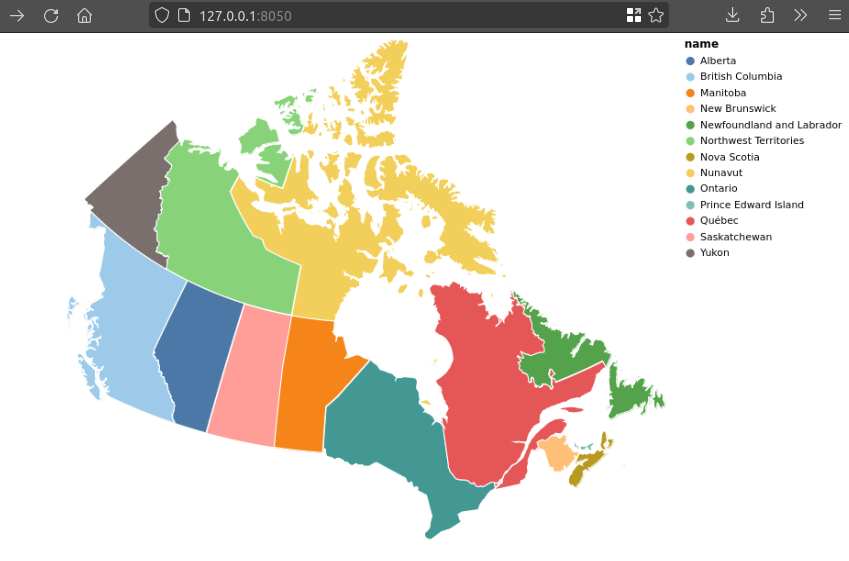

We could add a dropdown to select the country we show the regions for:

```python
import altair as alt
import dash_bootstrap_components as dbc
import dash_vega_components as dvc
from dash import Dash, dcc, callback, Input, Output
import geopandas as gpd


url = 'https://naciscdn.org/naturalearth/50m/cultural/ne_50m_admin_1_states_provinces.zip'
world_regions = gpd.read_file(url)[['wikipedia', 'name', 'region', 'admin', 'postal', 'latitude', 'longitude', 'geometry']]

# Initiatlize the app
app = Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])

# Layout
app.layout = dbc.Container([
    dcc.Dropdown(id='country', value='India', options=world_regions['admin'].unique()),
    dvc.Vega(id='map', spec={}),
])

# Server side callbacks/reactivity
@callback(
    Output('map', 'spec'),
    Input('country', 'value'),
)
def create_map(country):
    return alt.Chart(world_regions.query(f'admin == "{country}"'), width=600, height=500).mark_geoshape(stroke='white').encode(
        tooltip='name',
        color=alt.Color('name').scale(scheme='tableau20'),  # To avoid repeating colors
    ).to_dict()

# Run the app/dashboard
if __name__ == '__main__':
    app.run(debug=True)
```

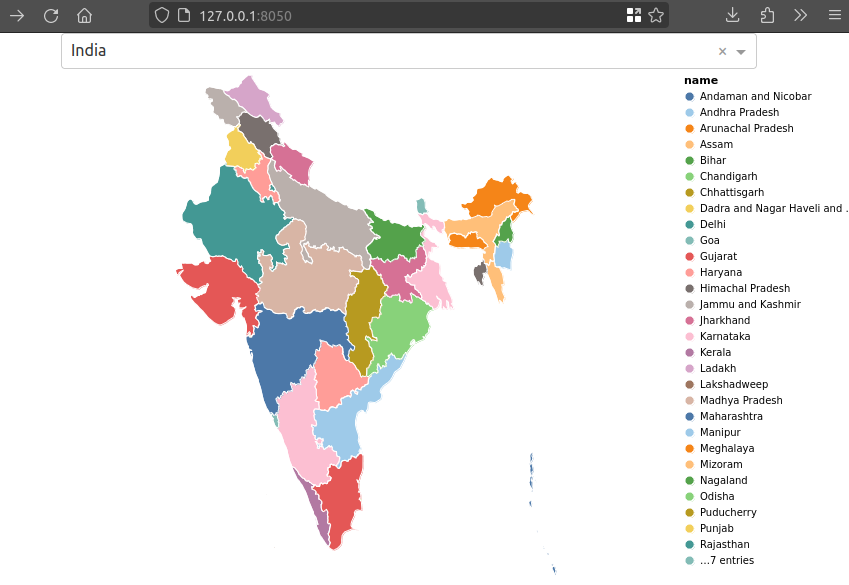

We can also create a callback that listens to click events on the chart.
For this,
we need to name the `selection` widget we are creating,
and add the argument `signalsToObserve` to the `dvc.Vega` component,
and then watch for changes to `signalData` in the `Input` class in the callback.
Please review last lecture's notes for how to do this with regular charts
(it's the same as with maps, but it can be good to see another example).

```python
import altair as alt
import dash_bootstrap_components as dbc
import dash_vega_components as dvc
from dash import Dash, dcc, callback, Input, Output, html
import geopandas as gpd


url = 'https://naciscdn.org/naturalearth/50m/cultural/ne_50m_admin_1_states_provinces.zip'
world_regions = gpd.read_file(url)[['wikipedia', 'name', 'admin', 'postal', 'latitude', 'longitude', 'geometry']]

# Initiatlize the app
app = Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])

# Layout
app.layout = dbc.Container([
    dcc.Dropdown(id='country', value='India', options=world_regions['admin'].unique()),
    dvc.Vega(id='map', spec={}, signalsToObserve=['select_region']),
    # dcc.Markdown(id='chart-selection')
    html.Div(id='chart-selection')
])

# Server side callbacks/reactivity
@callback(
    Output('map', 'spec'),
    Input('country', 'value'),
)
def create_map(country):
    select_region = alt.selection_point(fields=['name'], name='select_region')
    return alt.Chart(world_regions.query(f'admin == "{country}"'), width=600, height=500).mark_geoshape(stroke='white').encode(
        tooltip='name',
        color=alt.Color('name').scale(scheme='tableau20'),  # To avoid repeating colors
        opacity=alt.condition(select_region, alt.value(0.9), alt.value(0.3))
    ).add_params(
        select_region
    ).to_dict()

@callback(
    Output('chart-selection', 'children'),
    Input('map', 'signalData'),
)
def print_selection(clicked_region):
    print(clicked_region)  # So that you can see the full dictionary
    if clicked_region and 'name' in clicked_region['select_region']:
        return f'{clicked_region["select_region"]["name"]}'

# Run the app/dashboard
if __name__ == '__main__':
    app.run(debug=True)
```

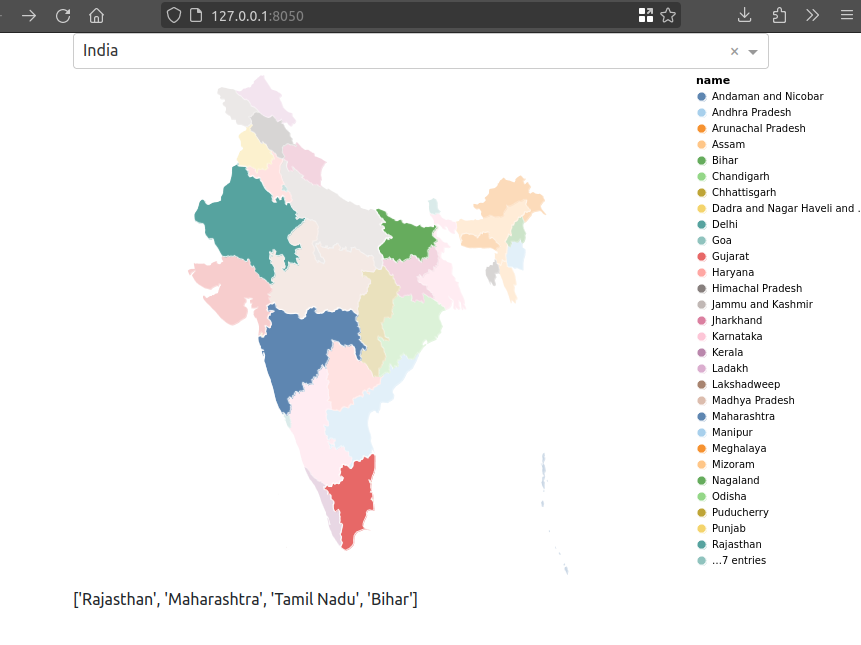

## Creating maps with plotly in R

Altair maps don't support zooming/panning
and also not "tiles" (i.e. backgrounds like OpenStreetMap).
For this, Plotly maps is a more suitable choice.
Plotly also has bindings in R,
which is what we will show here 
so that you have an alternative of what to use with Shiny.
The Python bindings are very similar in case you want to use Plotly
in Python.
There are a few other approaches to maps we could use in Shiny,
including `geom_sf` and `leaflet`.
You can [read more about Plotly maps for R in this documentation chapter](https://plotly-r.com/maps.html).

We can [use our own geojson files with plotly](https://plotly.com/r/choropleth-maps/),
and just like for Altair,
they also supply data sets for the coutries of the world,
and the US states.
In fact,
the default in plotly's `choropleth` function is to show a map of the world.

```py
df <- read.csv("https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv")
head(df)
```

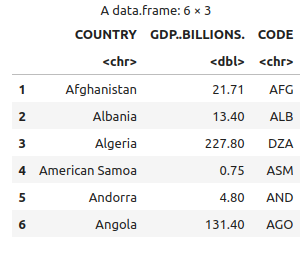

```r
library(plotly)

plot_ly(df, type='choropleth')
```

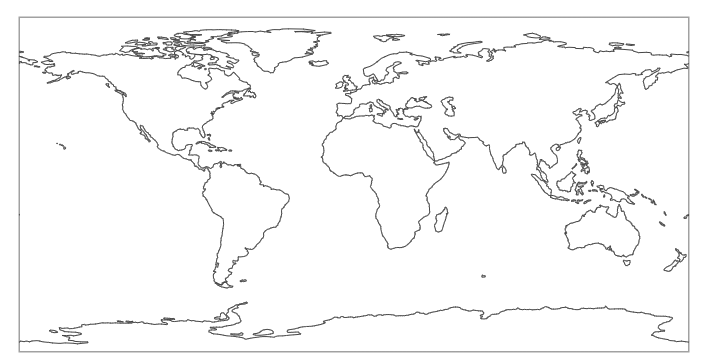

These are zoomable by default and can be linked to datasets with country codes.

Plotly uses `~` to reference a variable/column name in the dataframe.

```r
plot_ly(df, type='choropleth', locations=~CODE, z=~GDP..BILLIONS.)
```

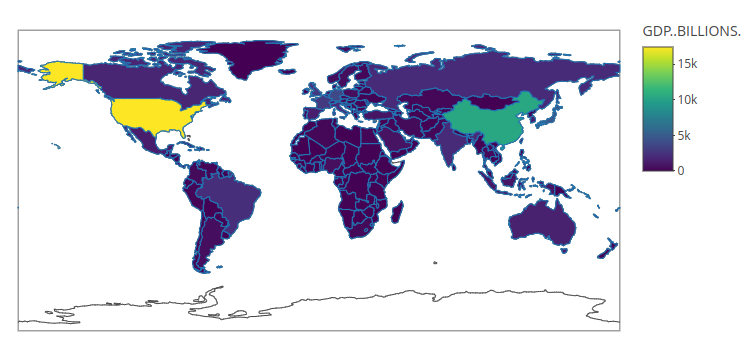

The value and country code is shown by default in the tooltip, and we can add any info from the data frame that we want.
We can also change the colorscale,
either [manually as per the docs](https://plotly.com/r/reference/#heatmap-colorscale)
or to one of these built-in strings:

```
Greys,YlGnBu,Greens,YlOrRd,Bluered,RdBu,Reds,Blues,Picnic,
Rainbow,Portland,Jet,Hot,Blackbody,Earth,Electric,Viridis,Cividis
```

```r
plot_ly(df, type='choropleth', locations=~CODE, z=~GDP..BILLIONS., text=~COUNTRY, colorscale='Blues')
```

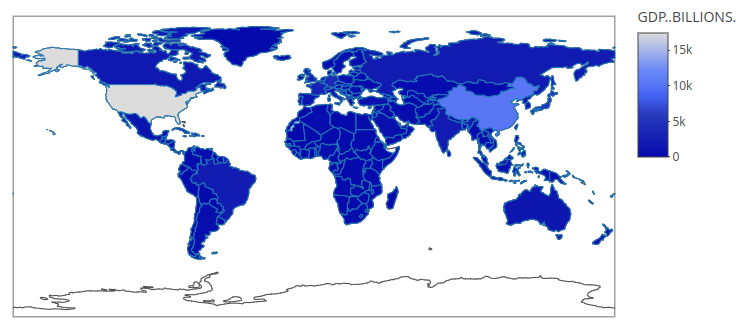

Let's use some US export data to see how we can zoom in on an area of the map.

```r
df <- read.csv("https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv")
head(df)
```

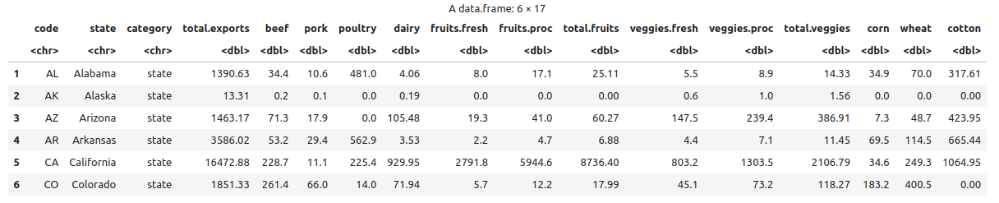

```r
p <- plot_ly(df, type = 'choropleth', locationmode = 'USA-states',
    z = ~total.exports, locations = ~code, color = ~total.exports, colors = 'Purples')
p
```

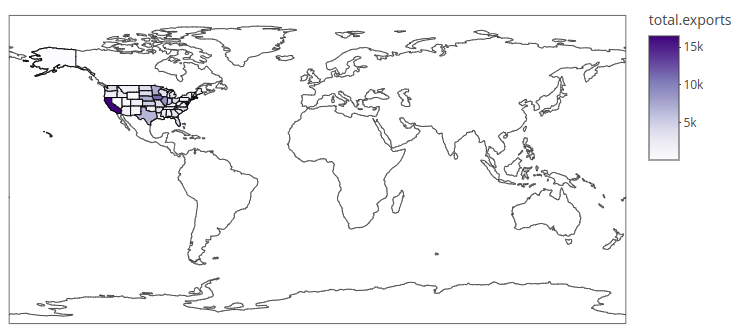

```r
p |> layout(geo = list(scope = 'usa', projection = list(type = 'albers usa')),
             title = 'USA exports')
```

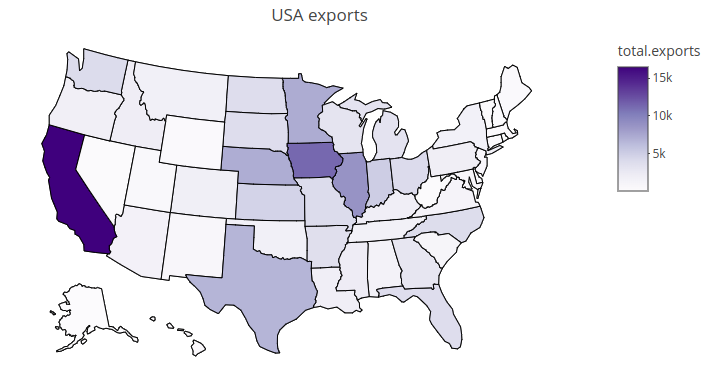

You can select by dragging, or change to select via clicking. If you also want clicks to send a plotly click even to use in another callback, then use `'event+click'`. [More about click events in the docs](https://plotly.com/r/reference/layout/#layout-clickmode)

```r
p |> layout(geo = list(scope = 'usa', projection = list(type = 'albers usa')),
             title = 'USA exports', clickmode = 'event+select')
```

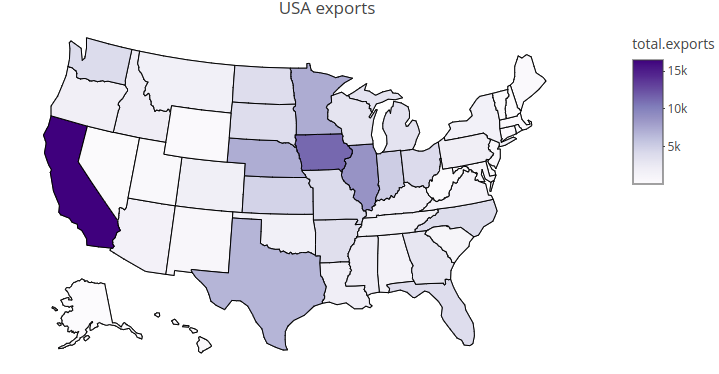

```r
df <- read.csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
head(df)
```

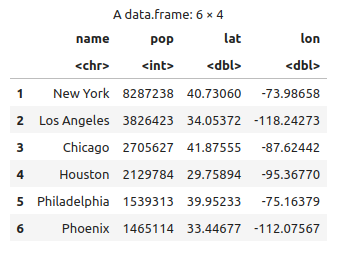

Note that you need to use `plot_geo` when overlaying points with a longitude and latitude.
The syntax is very similar to `plot_ly`.

```r
plot_geo(df, locationmode = 'USA-states', sizes = c(5, 250)) |>
    layout(geo = list(scope = 'usa', projection = list(type = 'albers usa'))) |>
    add_markers(x = ~lon, y = ~lat, size = ~pop, text = ~name, hoverinfo = 'text')
```

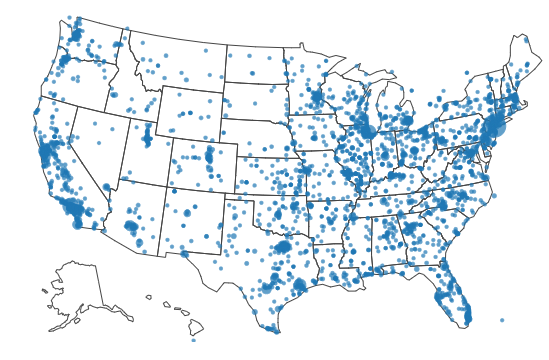

To color NANs grey for missing countries,
see these links (Python, but it will be similar in R).

- https://community.plotly.com/t/how-to-change-colors-for-na-values-to-gray-in-a-choropleth-map/15746
- https://plotly.com/r/choropleth-maps/ (last example)